# Cycle-GAN. ImgToImg translation.

![title](\imgs\sttrex.png)

### Апельсины против яблок. Как устроен CycleGAN на пальцах.
![title](\imgs\orvsap.png)

### Чем CycleGAN хорош?
![title](\imgs\pixvscg.png)

### Схема CycleGAN
![title](\imgs\cgan_scheme.png)

### Хитрости имплементации

Нельзя обучать генераторы напрямую, парных изображений нет.

1. Правдоподобие. Признаются ли реальными изображения, созданные 
генератором, соответствующим дискриминатором? Например, результат 
генератора g_BA признается правдоподобным дискриминатором d_A, 
а результат g_AB признается правдоподобным дискриминатором d_B.
2. Обратимость. Если применить два генератора друг за другом (в обоих 
направлениях), получится ли исходное изображение? Отметим, что сеть 
CycleGAN получила свое название от критерия циклической обратимости.
3. Идентичность. Если применить каждый генератор к изображениям из 
своей целевой области, то останется ли изображение неизменным?

### Пример 
![title](\imgs\cgan_res.png)

## Немного о генераторах

### U-net
![title](\imgs\u-net.png)

### ResNet
![title](\imgs\resnet.png)

![title](\imgs\resnetblock.png)

In [ ]:
import os
import numpy as np
import glob
import time
import PIL.Image as Image
from tqdm.notebook import tqdm
from itertools import chain
from collections import OrderedDict
import random

import torch
import torch.nn as nn
import torchvision.utils as vutils
import torchvision.datasets as dset
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import matplotlib.pylab as plt
import ipywidgets
from IPython import display

Error: Session cannot generate requests

In [ ]:
if torch.cuda.is_available():
    print("The code will run on GPU.")
else:
    print("The code will run on CPU. Go to Edit->Notebook Settings and choose GPU as the hardware accelerator")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

The code will run on GPU.


torch.Size([1, 3, 256, 256])


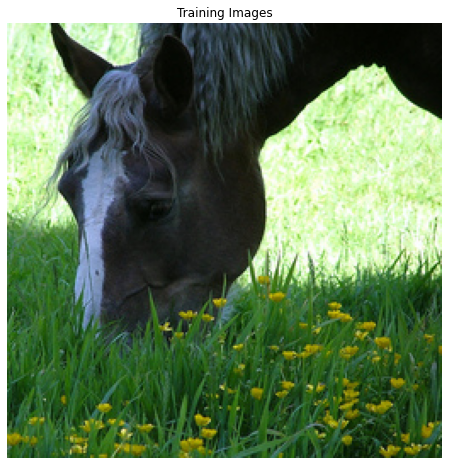

In [3]:
bs = 1
workers = 2
image_size = (256,256)
dataroot = 'horse2zebra\\horses_train\\'
dataset_horses_train = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0, 0, 0), (1, 1, 1)),
                              ]))
dataloader_train_horses = torch.utils.data.DataLoader(dataset_horses_train, batch_size=bs,
                                         shuffle=True, num_workers=workers)
real_batch = next(iter(dataloader_train_horses))
print(real_batch[0].shape)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:10], padding=2, normalize=True).cpu(),(1,2,0)))

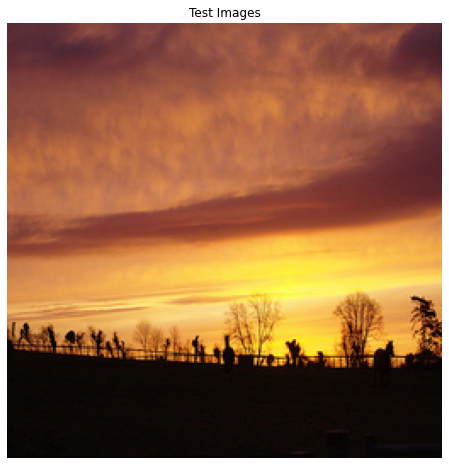

In [4]:
dataroot = 'horse2zebra\\horses_test\\'
dataset_horses_test = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0, 0, 0), (1, 1, 1)),
                              ]))
dataloader_test_horses = torch.utils.data.DataLoader(dataset_horses_test, batch_size=bs,
                                         shuffle=True, num_workers=workers)
real_batch = next(iter(dataloader_test_horses))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Test Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:10], padding=2, normalize=True).cpu(),(1,2,0)))

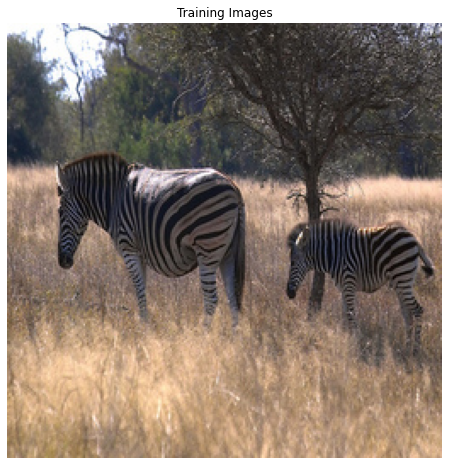

In [5]:
dataroot = 'horse2zebra\\zebra_train\\'
dataset_zebra_train = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0, 0, 0), (1, 1, 1)),
                              ]))
dataloader_zebra_train = torch.utils.data.DataLoader(dataset_zebra_train, batch_size=bs,
                                         shuffle=True, num_workers=workers)
real_batch = next(iter(dataloader_zebra_train))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:10], padding=2, normalize=True).cpu(),(1,2,0)))

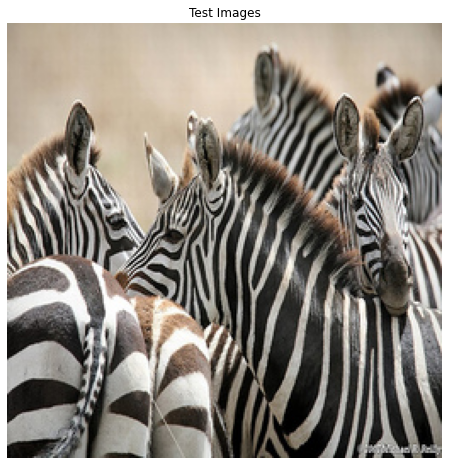

In [6]:
dataroot = 'horse2zebra\\zebra_test\\'
dataset_zebra_test = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0, 0, 0), (1, 1, 1)),
                              ]))
dataloader_zebra_test = torch.utils.data.DataLoader(dataset_zebra_test, batch_size=bs,
                                         shuffle=True, num_workers=workers)
real_batch = next(iter(dataloader_zebra_test))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Test Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:10], padding=2, normalize=True).cpu(),(1,2,0)))

In [7]:
def plot_images_test(dataloader_test_horses, dataloader_zebra_test): 
    batch_a_test = next(iter(dataloader_test_horses))[0].to(device)
    real_a_test = batch_a_test.cpu().detach()
    fake_b_test = G_A2B(batch_a_test ).cpu().detach()


    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((real_a_test[:4]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Real horses")
    plt.show()

          
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((fake_b_test[:4]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Fake zebras")
    plt.show()


    batch_b_test = next(iter(dataloader_zebra_test))[0].to(device)
    real_b_test = batch_b_test.cpu().detach()
    fake_a_test = G_B2A(batch_b_test ).cpu().detach()
    
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((real_b_test[:4]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Real zebras")
    plt.show()


    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((fake_a_test[:4]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Fake horses")
    plt.show()

In [8]:
def save_models(G_A2B, G_B2A, D_A, D_B, name):

  torch.save(G_A2B,name+"_G_A2B.pt")
  torch.save(G_B2A, name+"_G_B2A.pt")
  torch.save(D_A, name+"_D_A.pt")
  torch.save(D_B, name+"_D_B.pt")

def load_models( name):

  G_A2B=torch.load(name+"_G_A2B.pt")
  G_B2A=torch.load(name+"_G_B2A.pt")
  D_A=torch.load(name+"_D_A.pt")
  D_B=torch.load(name+"_D_B.pt")
  return G_A2B, G_B2A, D_A, D_B

#save_models(G_A2B, G_B2A, D_A, D_B, "test")
#G_A2B, G_B2A, D_A, D_B= load_models("test")

In [9]:
norm_layer = nn.InstanceNorm2d
class ResBlock(nn.Module):
    def __init__(self, f):
        super(ResBlock, self).__init__()
        self.conv = nn.Sequential(nn.Conv2d(f, f, 3, 1, 1), norm_layer(f), nn.ReLU(),
                                  nn.Conv2d(f, f, 3, 1, 1))
        self.norm = norm_layer(f)
    def forward(self, x):
        return F.relu(self.norm(self.conv(x)+x))

class Generator(nn.Module):
    def __init__(self, f=64, blocks=9):
        super(Generator, self).__init__()
        layers = [nn.ReflectionPad2d(3),
                  nn.Conv2d(  3,   f, 7, 1, 0), norm_layer(  f), nn.ReLU(True),
                  nn.Conv2d(  f, 2*f, 3, 2, 1), norm_layer(2*f), nn.ReLU(True),
                  nn.Conv2d(2*f, 4*f, 3, 2, 1), norm_layer(4*f), nn.ReLU(True)]
        for i in range(int(blocks)):
            layers.append(ResBlock(4*f))
        layers.extend([
                nn.ConvTranspose2d(4*f, 4*2*f, 3, 1, 1), nn.PixelShuffle(2), norm_layer(2*f), nn.ReLU(True),
                nn.ConvTranspose2d(2*f,   4*f, 3, 1, 1), nn.PixelShuffle(2), norm_layer(  f), nn.ReLU(True),
                nn.ReflectionPad2d(3), nn.Conv2d(f, 3, 7, 1, 0),
                nn.Tanh()])
        self.conv = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.conv(x)

In [10]:
nc=3
ndf=64
class Discriminator(nn.Module):  
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(nc,ndf,4,2,1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 64 x 64
            nn.Conv2d(ndf,ndf*2,4,2,1, bias=False),
            nn.InstanceNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 32 x 32
            nn.Conv2d(ndf*2, ndf * 4, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 16 x 16
            nn.Conv2d(ndf*4,ndf*8,4,1,1),
            nn.InstanceNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 15 x 15
            nn.Conv2d(ndf*8,1,4,1,1)
            # state size. 1 x 14 x 14
        )

    def forward(self, input):
        return self.main(input)

In [11]:
def LSGAN_D(real, fake):
  return (torch.mean((real - 1)**2) + torch.mean(fake**2))

def LSGAN_G(fake):
  return  torch.mean((fake - 1)**2)

In [12]:
G_A2B = Generator().to(device)
G_B2A = Generator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

# Initialize Loss function
criterion_Im = torch.nn.L1Loss() 

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5


In [13]:
def training(G_A2B, G_B2A, D_A, D_B,num_epochs,name,bs=bs,old = True):

  

  # Training Loop

  # Lists to keep track of progress
  img_list = []
  G_losses = []
  D_A_losses = []
  D_B_losses = []


  iters=0
  FDL_A2B = []
  FDL_B2A = []
  CL_A = []
  CL_B = []
  ID_B2A = []
  ID_A2B = []
  disc_A = []
  disc_B = []


  FDL_A2B_t = []
  FDL_B2A_t = []
  CL_A_t = []
  CL_B_t = []
  ID_B2A_t = []
  ID_A2B_t = []
  disc_A_t = []
  disc_B_t = []

  print("Starting Training Loop...")
  # For each epoch
  for epoch in range(num_epochs):

    # For each batch in the dataloader
    for  i,(data_horse, data_zebra) in enumerate(zip(dataloader_train_horses, dataloader_zebra_train),0):
    
        # Set model input
        a_real = data_horse[0].to(device)
        b_real = data_zebra[0].to(device)
      
        tensor_ones=torch.ones([a_real.shape[0],1,14,14]).cuda()
        tensor_zeros=torch.zeros([a_real.shape[0],1,14,14]).cuda()

        # Genrated images
        b_fake = G_A2B(a_real)
        a_rec = G_B2A(b_fake)
        a_fake = G_B2A(b_real)
        b_rec = G_A2B(a_fake)


        # Discriminator A
        optimizer_D_A.zero_grad()
        if((iters > 0 or epoch > 0) and old and iters % 3 == 0):
          rand_int = random.randint(bs, old_a_fake.shape[0]-1)
          Disc_loss_A = LSGAN_D(D_A(a_real), D_A(old_a_fake[rand_int-bs:rand_int].detach()))
          D_A_losses.append(Disc_loss_A.item())

        else:
          Disc_loss_A = LSGAN_D(D_A(a_real), D_A(a_fake.detach()))
          D_A_losses.append(Disc_loss_A.item())
        
        Disc_loss_A.backward()
        optimizer_D_A.step()

        
        # Discriminator B

        optimizer_D_B.zero_grad()
        if((iters > 0 or epoch > 0) and old and iters % 3 == 0):
          rand_int = random.randint(bs, old_b_fake.shape[0]-1)
          Disc_loss_B =  LSGAN_D(D_B(b_real), D_B(old_b_fake[rand_int-bs:rand_int].detach()))
          D_B_losses.append(Disc_loss_B.item())
        else:
          Disc_loss_B =  LSGAN_D(D_B(b_real), D_B(b_fake.detach()))
          D_B_losses.append(Disc_loss_B.item())

        Disc_loss_B.backward()
        optimizer_D_B.step()   

        # Generator

        optimizer_G_A2B.zero_grad()
        optimizer_G_B2A.zero_grad()


        # Fool discriminator
        Fool_disc_loss_A2B = LSGAN_G(D_B(b_fake))
        Fool_disc_loss_B2A = LSGAN_G(D_A(a_fake))

        # Cycle Consistency    both use the two generators
        Cycle_loss_A = criterion_Im(a_rec, a_real)*5
        Cycle_loss_B = criterion_Im(b_rec, b_real)*5

        # Identity loss
        Id_loss_B2A = criterion_Im(G_B2A(a_real), a_real)*10
        Id_loss_A2B = criterion_Im(G_A2B(b_real), b_real)*10

        # generator losses


        Loss_G = Fool_disc_loss_A2B+Fool_disc_loss_B2A+Cycle_loss_A+Cycle_loss_B+Id_loss_B2A+Id_loss_A2B
        G_losses.append(Loss_G)

        # Backward propagation
        Loss_G.backward()
        
        
        # Optimisation step
        optimizer_G_A2B.step()
        optimizer_G_B2A.step()

        FDL_A2B.append(Fool_disc_loss_A2B)
        FDL_B2A.append(Fool_disc_loss_B2A)
        CL_A.append(Cycle_loss_A)
        CL_B.append(Cycle_loss_B)
        ID_B2A.append(Id_loss_B2A)
        ID_A2B.append(Id_loss_A2B)
        disc_A.append(Disc_loss_A)
        disc_B.append(Disc_loss_B)

        if(iters == 0 and epoch == 0):
          old_b_fake = b_fake.clone()
          old_a_fake = a_fake.clone()
        elif (old_b_fake.shape[0] == bs*5 and b_fake.shape[0]==bs):
          rand_int = random.randint(5, 24)
          old_b_fake[rand_int-5:rand_int] = b_fake.clone()
          old_a_fake[rand_int-5:rand_int] = a_fake.clone()
        elif(old_b_fake.shape[0]< 25):
          old_b_fake = torch.cat((b_fake.clone(),old_b_fake))
          old_a_fake = torch.cat((a_fake.clone(),old_a_fake))

        iters += 1
        del data_zebra, data_horse, a_real, b_real, a_fake, b_fake


        if iters % 50 == 0:
      
          print('[%d/%d]\tFDL_A2B: %.4f\tFDL_B2A: %.4f\tCL_A: %.4f\tCL_B: %.4f\tID_B2A: %.4f\tID_A2B: %.4f\tLoss_D_A: %.4f\tLoss_D_A: %.4f'
                      % (epoch+1, num_epochs, Fool_disc_loss_A2B, Fool_disc_loss_B2A,Cycle_loss_A,Cycle_loss_B,Id_loss_B2A,
                          Id_loss_A2B, Disc_loss_A.item(), Disc_loss_B.item()))
        

    FDL_A2B_t.append(sum(FDL_A2B)/len(FDL_A2B))
    FDL_B2A_t.append(sum(FDL_B2A)/len(FDL_B2A))
    CL_A_t.append(sum(CL_A)/len(CL_A))
    CL_B_t.append(sum(CL_B)/len(CL_B))
    ID_B2A_t.append(sum(ID_B2A)/len(ID_B2A))
    ID_A2B_t.append(sum(ID_A2B)/len(ID_A2B))
    disc_A_t.append(sum(disc_A)/len(disc_A))
    disc_B_t.append(sum(disc_B)/len(disc_B))

    FDL_A2B = []
    FDL_B2A = []
    CL_A = []
    CL_B = []
    ID_B2A = []
    ID_A2B = []
    disc_B = []
    disc_A = []

    iters = 0             
    save_models(G_A2B, G_B2A, D_A, D_B, name)
    if (epoch % 5 == 0):
      plot_images_test(dataloader_test_horses, dataloader_zebra_test)
    #plot_all_images(4, dataloader_test_horses, dataloader_zebra_test)
  return(FDL_A2B_t,FDL_B2A_t,CL_A_t,CL_B_t,ID_B2A_t,ID_A2B_t,disc_A_t,disc_B_t)

Starting Training Loop...
[1/20]	FDL_A2B: 0.5545	FDL_B2A: 0.2592	CL_A: 0.7616	CL_B: 0.7733	ID_B2A: 1.3009	ID_A2B: 1.2900	Loss_D_A: 0.4776	Loss_D_A: 0.6730
[1/20]	FDL_A2B: 0.2837	FDL_B2A: 0.3898	CL_A: 0.7044	CL_B: 1.0025	ID_B2A: 1.2111	ID_A2B: 1.7651	Loss_D_A: 0.3015	Loss_D_A: 0.3159
[1/20]	FDL_A2B: 0.5005	FDL_B2A: 0.3703	CL_A: 0.7307	CL_B: 0.7378	ID_B2A: 1.2762	ID_A2B: 1.4481	Loss_D_A: 0.5450	Loss_D_A: 0.6569
[1/20]	FDL_A2B: 0.4543	FDL_B2A: 0.3887	CL_A: 0.7502	CL_B: 0.5795	ID_B2A: 1.6248	ID_A2B: 1.0001	Loss_D_A: 0.5448	Loss_D_A: 0.5315
[1/20]	FDL_A2B: 0.4709	FDL_B2A: 0.6418	CL_A: 0.8335	CL_B: 0.8363	ID_B2A: 1.4332	ID_A2B: 1.3758	Loss_D_A: 0.3317	Loss_D_A: 0.3553
[1/20]	FDL_A2B: 0.4925	FDL_B2A: 0.5571	CL_A: 0.7330	CL_B: 0.9934	ID_B2A: 1.1816	ID_A2B: 1.7011	Loss_D_A: 0.3473	Loss_D_A: 0.4249
[1/20]	FDL_A2B: 0.5589	FDL_B2A: 0.5040	CL_A: 0.7473	CL_B: 0.8023	ID_B2A: 1.3292	ID_A2B: 1.1110	Loss_D_A: 0.3639	Loss_D_A: 0.4431
[1/20]	FDL_A2B: 0.7182	FDL_B2A: 0.4638	CL_A: 0.7930	CL_B: 1.4720	ID_B2A

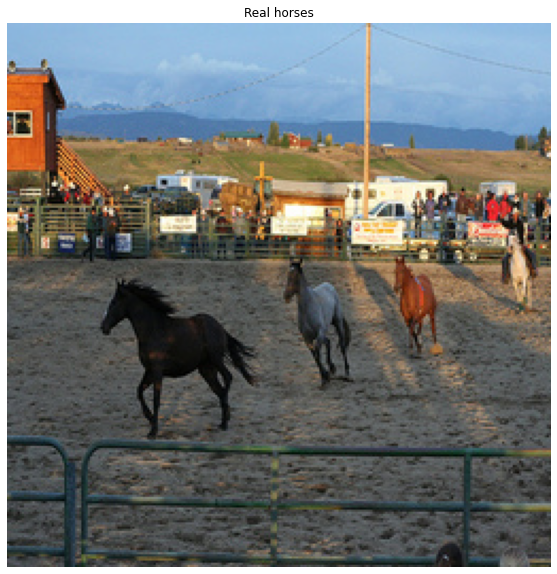

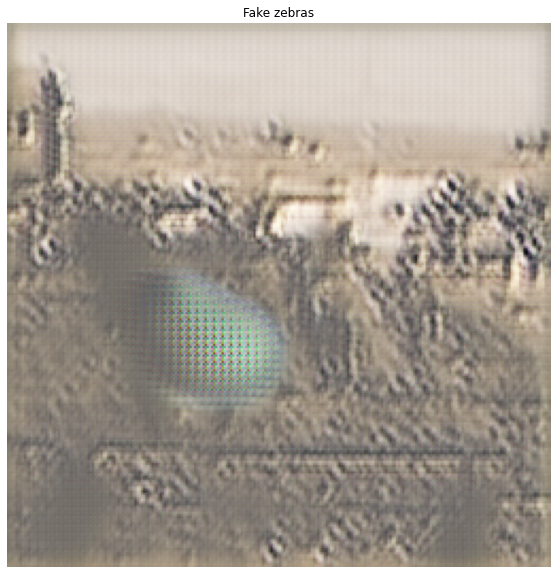

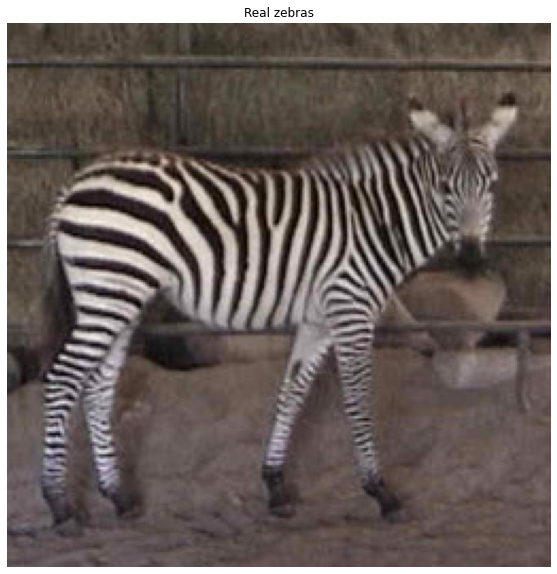

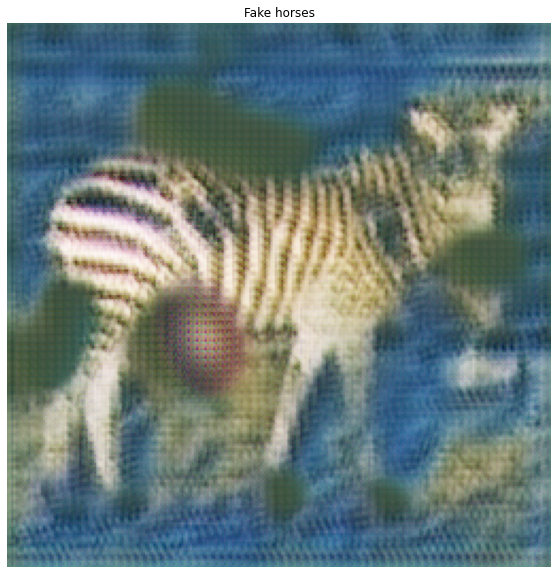

[2/20]	FDL_A2B: 0.9665	FDL_B2A: 0.6946	CL_A: 0.8905	CL_B: 0.8079	ID_B2A: 1.6538	ID_A2B: 1.5653	Loss_D_A: 0.3224	Loss_D_A: 0.2566
[2/20]	FDL_A2B: 0.6372	FDL_B2A: 0.6813	CL_A: 0.7554	CL_B: 1.4191	ID_B2A: 1.1225	ID_A2B: 2.7962	Loss_D_A: 0.2425	Loss_D_A: 0.0769
[2/20]	FDL_A2B: 0.6668	FDL_B2A: 0.7300	CL_A: 1.5344	CL_B: 0.5837	ID_B2A: 2.2376	ID_A2B: 1.0772	Loss_D_A: 0.3014	Loss_D_A: 0.3846
[2/20]	FDL_A2B: 0.8311	FDL_B2A: 0.6640	CL_A: 0.9351	CL_B: 1.4589	ID_B2A: 1.3825	ID_A2B: 2.7821	Loss_D_A: 0.3223	Loss_D_A: 0.1460
[2/20]	FDL_A2B: 0.3386	FDL_B2A: 0.6568	CL_A: 0.8118	CL_B: 0.9731	ID_B2A: 1.1718	ID_A2B: 1.9528	Loss_D_A: 0.2426	Loss_D_A: 0.0702
[2/20]	FDL_A2B: 1.0152	FDL_B2A: 0.6449	CL_A: 0.9572	CL_B: 0.9044	ID_B2A: 1.8114	ID_A2B: 1.7174	Loss_D_A: 0.2342	Loss_D_A: 0.3089
[2/20]	FDL_A2B: 0.4855	FDL_B2A: 0.2528	CL_A: 0.8428	CL_B: 0.7212	ID_B2A: 1.6112	ID_A2B: 1.3415	Loss_D_A: 0.5911	Loss_D_A: 0.1907
[2/20]	FDL_A2B: 0.6399	FDL_B2A: 0.2356	CL_A: 1.5935	CL_B: 0.9060	ID_B2A: 3.2436	ID_A2B: 1.5149	Lo

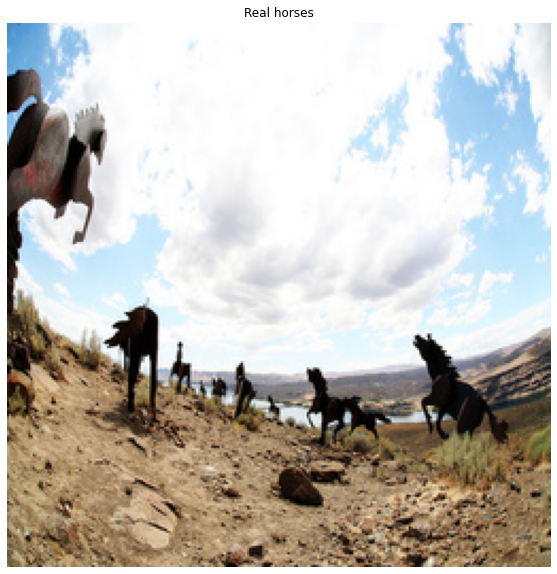

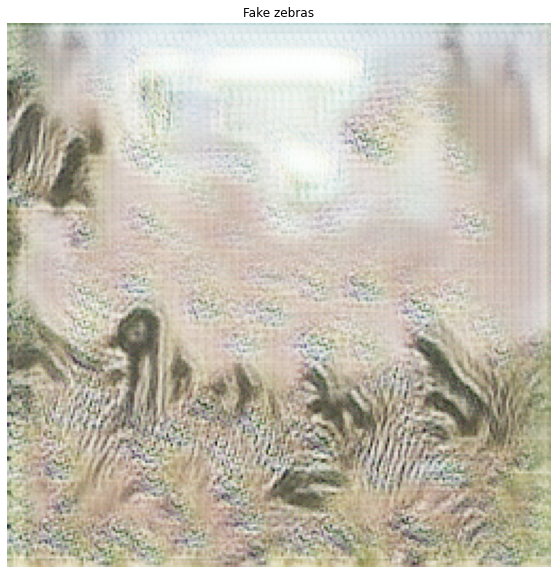

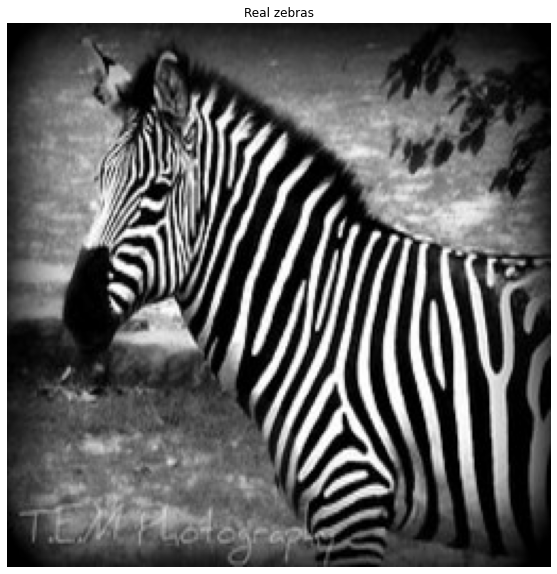

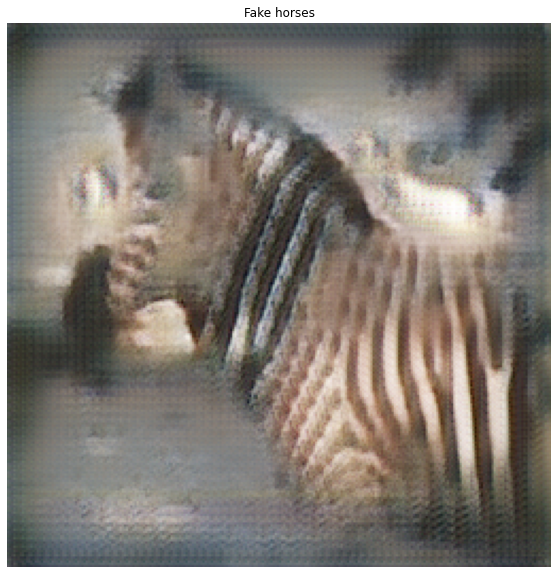

[7/20]	FDL_A2B: 0.4741	FDL_B2A: 0.6257	CL_A: 0.5016	CL_B: 0.6627	ID_B2A: 0.8895	ID_A2B: 1.0710	Loss_D_A: 0.2485	Loss_D_A: 0.3362
[7/20]	FDL_A2B: 0.6014	FDL_B2A: 0.1642	CL_A: 0.3668	CL_B: 0.6371	ID_B2A: 0.7801	ID_A2B: 1.1969	Loss_D_A: 0.2672	Loss_D_A: 0.4336
[7/20]	FDL_A2B: 0.3865	FDL_B2A: 0.2911	CL_A: 0.7727	CL_B: 0.7325	ID_B2A: 1.1258	ID_A2B: 1.3758	Loss_D_A: 0.5296	Loss_D_A: 0.7672
[7/20]	FDL_A2B: 0.4748	FDL_B2A: 0.4005	CL_A: 1.4471	CL_B: 0.5374	ID_B2A: 1.6881	ID_A2B: 0.9035	Loss_D_A: 0.3751	Loss_D_A: 0.3053
[7/20]	FDL_A2B: 0.3675	FDL_B2A: 0.2340	CL_A: 0.4686	CL_B: 0.7008	ID_B2A: 0.7816	ID_A2B: 1.1795	Loss_D_A: 0.1379	Loss_D_A: 0.1467
[7/20]	FDL_A2B: 0.6708	FDL_B2A: 0.4829	CL_A: 0.5739	CL_B: 0.7732	ID_B2A: 1.1000	ID_A2B: 1.3291	Loss_D_A: 0.3615	Loss_D_A: 0.2152
[7/20]	FDL_A2B: 0.6085	FDL_B2A: 0.3481	CL_A: 0.4918	CL_B: 0.5928	ID_B2A: 1.1892	ID_A2B: 0.9050	Loss_D_A: 0.4619	Loss_D_A: 0.3041
[7/20]	FDL_A2B: 0.1269	FDL_B2A: 0.2683	CL_A: 0.5986	CL_B: 0.6595	ID_B2A: 0.9821	ID_A2B: 0.9681	Lo

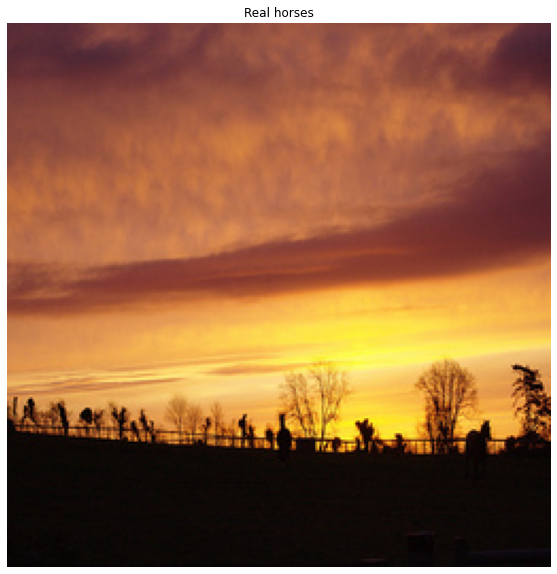

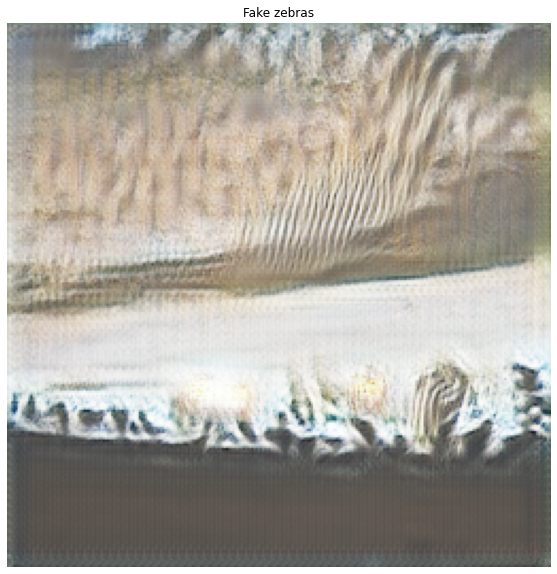

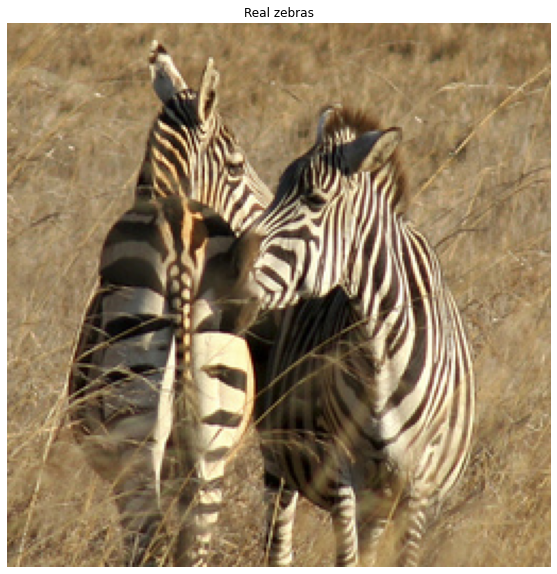

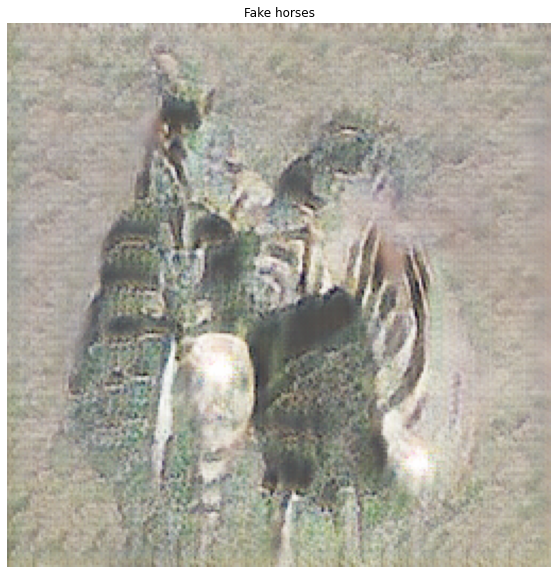

[12/20]	FDL_A2B: 0.4534	FDL_B2A: 0.5141	CL_A: 0.6538	CL_B: 0.5687	ID_B2A: 1.0938	ID_A2B: 1.0350	Loss_D_A: 0.2493	Loss_D_A: 0.3418
[12/20]	FDL_A2B: 0.3921	FDL_B2A: 0.5242	CL_A: 0.6120	CL_B: 0.6577	ID_B2A: 1.1642	ID_A2B: 1.1035	Loss_D_A: 0.1085	Loss_D_A: 0.1227
[12/20]	FDL_A2B: 0.6041	FDL_B2A: 0.3694	CL_A: 0.8005	CL_B: 0.8664	ID_B2A: 2.6203	ID_A2B: 1.5836	Loss_D_A: 0.7312	Loss_D_A: 0.4485
[12/20]	FDL_A2B: 0.1939	FDL_B2A: 0.3929	CL_A: 0.4831	CL_B: 0.5817	ID_B2A: 0.7428	ID_A2B: 1.1263	Loss_D_A: 0.3905	Loss_D_A: 0.6696
[12/20]	FDL_A2B: 0.1310	FDL_B2A: 0.3614	CL_A: 0.5722	CL_B: 0.8203	ID_B2A: 1.0570	ID_A2B: 1.7482	Loss_D_A: 0.6613	Loss_D_A: 0.3132
[12/20]	FDL_A2B: 0.8974	FDL_B2A: 0.4010	CL_A: 0.5656	CL_B: 0.7460	ID_B2A: 1.0063	ID_A2B: 1.2775	Loss_D_A: 0.4121	Loss_D_A: 0.0733
[12/20]	FDL_A2B: 0.5935	FDL_B2A: 0.3898	CL_A: 0.7575	CL_B: 0.8136	ID_B2A: 1.1219	ID_A2B: 1.5016	Loss_D_A: 0.4668	Loss_D_A: 0.4665
[12/20]	FDL_A2B: 0.4473	FDL_B2A: 0.2408	CL_A: 0.3823	CL_B: 0.5161	ID_B2A: 0.8418	ID_A2B: 0

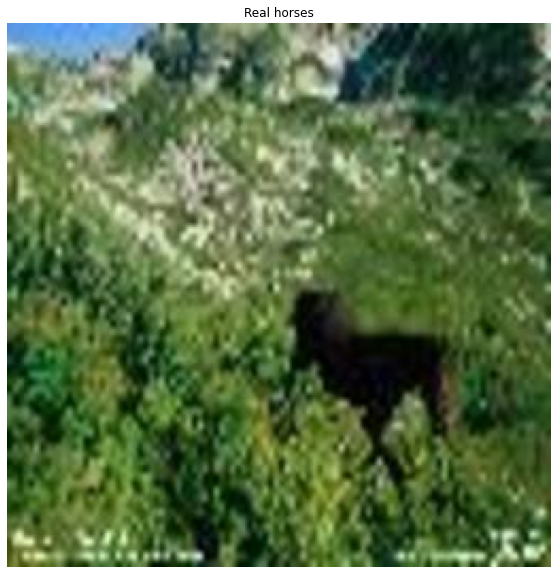

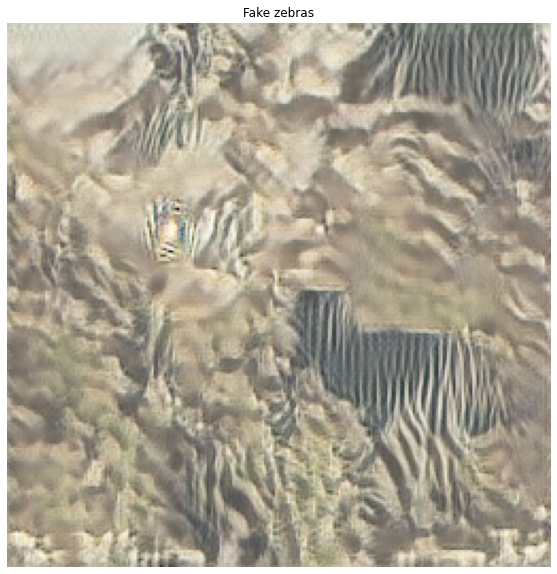

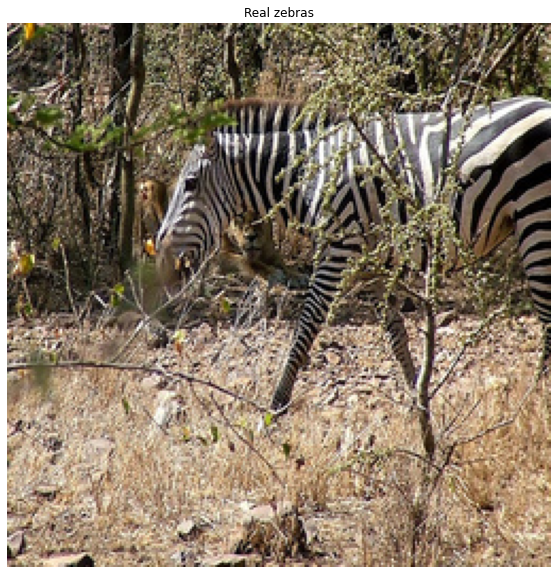

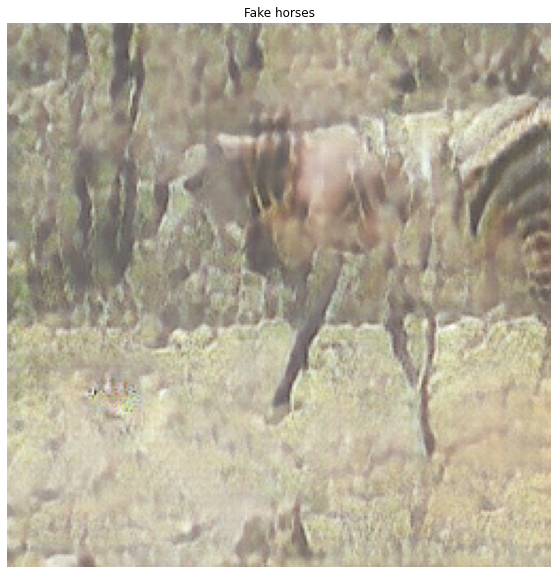

[17/20]	FDL_A2B: 0.3767	FDL_B2A: 0.3040	CL_A: 0.5596	CL_B: 0.5684	ID_B2A: 1.1642	ID_A2B: 0.7381	Loss_D_A: 0.6640	Loss_D_A: 0.3341
[17/20]	FDL_A2B: 0.2673	FDL_B2A: 0.2997	CL_A: 0.7492	CL_B: 1.0496	ID_B2A: 0.8420	ID_A2B: 1.7220	Loss_D_A: 0.1973	Loss_D_A: 0.4341
[17/20]	FDL_A2B: 0.6546	FDL_B2A: 0.5105	CL_A: 0.3537	CL_B: 0.8899	ID_B2A: 0.8975	ID_A2B: 1.2569	Loss_D_A: 0.3437	Loss_D_A: 0.6734
[17/20]	FDL_A2B: 0.5194	FDL_B2A: 0.5902	CL_A: 0.6704	CL_B: 0.6913	ID_B2A: 1.2571	ID_A2B: 1.1293	Loss_D_A: 0.3576	Loss_D_A: 0.3356
[17/20]	FDL_A2B: 0.6294	FDL_B2A: 0.6822	CL_A: 0.7681	CL_B: 0.7192	ID_B2A: 1.3860	ID_A2B: 1.1609	Loss_D_A: 0.2957	Loss_D_A: 0.1555
[17/20]	FDL_A2B: 0.3644	FDL_B2A: 0.7547	CL_A: 0.6488	CL_B: 0.9088	ID_B2A: 1.1475	ID_A2B: 1.9590	Loss_D_A: 0.1566	Loss_D_A: 0.9983
[17/20]	FDL_A2B: 0.9331	FDL_B2A: 0.5469	CL_A: 0.4537	CL_B: 0.7938	ID_B2A: 0.8538	ID_A2B: 0.7900	Loss_D_A: 0.3378	Loss_D_A: 0.0712
[17/20]	FDL_A2B: 0.5620	FDL_B2A: 0.4225	CL_A: 0.5079	CL_B: 0.6711	ID_B2A: 1.0633	ID_A2B: 1

In [14]:
name="Basic9_old_256_training50"
#name="Basic9_training50"
#name = 'basic_training50'
epochs=20
netG_A2B, netG_B2A, netD_A, netD_B=G_A2B, G_B2A, D_A, D_B

optimizer_G_A2B = torch.optim.Adam(G_A2B.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_G_B2A = torch.optim.Adam(G_B2A.parameters(), lr=lr, betas=(beta1, 0.999))

optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr, betas=(beta1, 0.999))

losses = training( netG_A2B, netG_B2A, netD_A, netD_B,epochs,name)

ДЗ:
CycleGAN перенести стиль Ван Гога на изображения и нарисовать свое селфи в стиле Ван Гога